<a href="https://colab.research.google.com/github/narendrapatel6321-dotcom/Caltech_256_Classification/blob/main/caltech_256.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1.1 - Download Helper Files

In [1]:
import urllib.request

files = {
    "helper_cv.py":         "https://raw.githubusercontent.com/narendrapatel6321-dotcom/Caltech_256_Classification/main/helper_cv.py",
    "resumable_trainer.py": "https://raw.githubusercontent.com/narendrapatel6321-dotcom/Caltech_256_Classification/main/resumable_trainer.py",
}

for filename, url in files.items():
    urllib.request.urlretrieve(url, filename)
    print(f"Downloaded: {filename}")


Downloaded: helper_cv.py
Downloaded: resumable_trainer.py


# 1.2 - Imports

In [2]:
import os
import random
import urllib.request
import gc
from pathlib import Path
import shutil
import tarfile
import zipfile

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import regularizers
from tensorflow.keras.layers import (
    Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
)

from tensorflow.keras.optimizers import Adam , SGD

from helper_cv import (
    download_data,
    prepare_dataset_splits,
    load_saved_splits,
    make_tf_dataset,
    plot_sample_images,
    plot_augmentation_preview,
    plot_training_curve,
    get_predictions,
    evaluate_model,
    plot_per_class_accuracy,
    plot_worst_predictions,
    grad_cam,
    plot_grad_cam_grid,
    get_best_model_path
)
from resumable_trainer import ResumableTrainer, find_checkpoint_root

# 1.3 - Mount Drive & Paths

In [5]:
from google.colab import drive
drive.mount('/content/drive')

# Root checkpoint folder (works on any account)
CKPT_ROOT = find_checkpoint_root("Colab_Experiments")

# Project-level directories
PROJECT   = "caltech256_efficientnetv2s"
DATA_DIR  = Path(CKPT_ROOT) / PROJECT / "data"
PLOTS_DIR = Path(CKPT_ROOT) / PROJECT / "plots"

for d in [DATA_DIR, PLOTS_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print("Directories ready:")
print(f"  Data    : {DATA_DIR}")
print(f"  Plots   : {PLOTS_DIR}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Directories ready:
  Data    : /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/data
  Plots   : /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/plots


# 1.4 - Reproducibility

In [6]:
SEED = 21
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
tf.keras.utils.set_random_seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)

print(f"Seed          : {SEED}")
print(f"TensorFlow    : {tf.__version__}")
print(f"GPU available : {tf.config.list_physical_devices('GPU')}")

Seed          : 21
TensorFlow    : 2.19.0
GPU available : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# 2.1 - Download Dataset

In [7]:
LOCAL_DATA = download_data(
    kaggle_json_path = Path(CKPT_ROOT) / "kaggle.json",
    kaggle_dataset   = "narendraiitb27/caltech-256",
    local_dir        = "/content/caltech256"
)

 Kaggle authenticated.
 Extracting...
 Dataset ready at /content/caltech256/256_ObjectCategories


#2.2 - Prepare Splits

In [8]:
prepare_dataset_splits(
    local_dir = LOCAL_DATA,
    save_dir  = DATA_DIR
)

 Splits already exist in /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/data. Skipping creation.


# 2.3 - Load Saved Splits

In [9]:
train_df, val_df, test_df, class_names, class_weights = load_saved_splits(
    data_dir=DATA_DIR,
    local_image_dir=LOCAL_DATA
)
NUM_CLASSES = len(class_names)
print(f"Number of classes : {NUM_CLASSES}")

 Paths remapped → /content/caltech256/256_ObjectCategories
 Splits loaded from /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/data
   Classes : 256
   Train   : 21,234 | Val : 2,304 | Test : 2,304
Number of classes : 256


# 2.4 - EDA: Sample Images

 Plot saved → /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/plots/sample_images.png


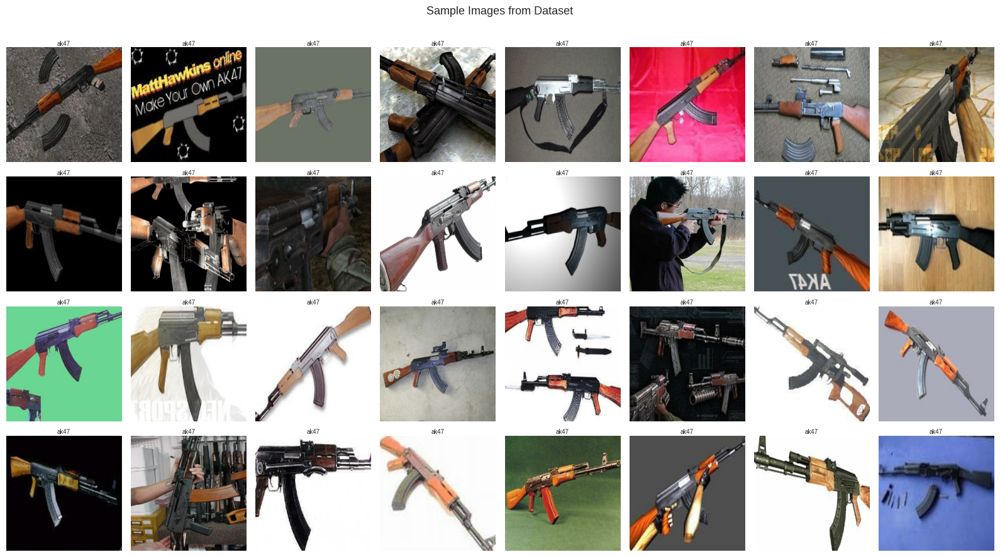

In [ ]:
preview_ds = make_tf_dataset(
    paths       = train_df["path"].values,
    labels      = train_df["label"].values,
    split       = "val",
    img_size    = 224,
    batch_size  = 32,
)

plot_sample_images(
    dataset    = preview_ds,
    class_names = class_names,
    n_per_row  = 8,
    n_rows     = 4,
    save_path  = PLOTS_DIR / "sample_images.png"
)

# 2.5 - Augmentation Preview

Sample class : kayak
Sample path  : /content/caltech256/256_ObjectCategories/122.kayak/122_0030.jpg
 Plot saved → /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/plots/augmentation_preview.png


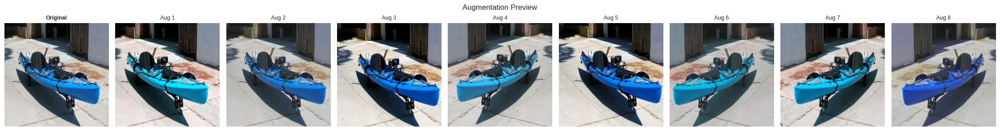

In [ ]:
# Pick a random image from the training set and visualize augmentations
sample_path = train_df["path"].sample(1, random_state=SEED).values[0]
sample_class = class_names[train_df.loc[train_df["path"] == sample_path, "label"].values[0]]

print(f"Sample class : {sample_class}")
print(f"Sample path  : {sample_path}")

plot_augmentation_preview(
    image_path = sample_path,
    save_path  = PLOTS_DIR / "augmentation_preview.png"
)

# 2.6 - Build tf.data Pipelines

In [10]:
IMG_SIZE   = 224
BATCH_SIZE = 128

train_ds = make_tf_dataset(
    paths       = train_df["path"].values,
    labels      = train_df["label"].values,
    split       = "train",
    img_size    = IMG_SIZE,
    batch_size  = BATCH_SIZE,
    augment     = True,
    seed        = SEED,
    class_weights = class_weights
)

val_ds = make_tf_dataset(
    paths       = val_df["path"].values,
    labels      = val_df["label"].values,
    split       = "val",
    img_size    = IMG_SIZE,
    batch_size  = BATCH_SIZE,
)

test_ds = make_tf_dataset(
    paths       = test_df["path"].values,
    labels      = test_df["label"].values,
    split       = "test",
    img_size    = IMG_SIZE,
    batch_size  = BATCH_SIZE,
)

print(f"Train batches : {len(train_ds)}")
print(f"Val batches   : {len(val_ds)}")
print(f"Test batches  : {len(test_ds)}")

Train batches : 165
Val batches   : 18
Test batches  : 18


#3.1 - Constants

In [11]:
EPOCHS_P1   = 50   # Phase 1 — frozen backbone
EPOCHS_P2   = 50    # Phase 2 — partial fine-tuning
EPOCHS_P3   = 50    # Phase 3 — full fine-tuning

# 3.2 - Classifier Head

In [12]:
def build_head(base_output, num_classes: int, dropout_rate: float = 0.5):
    """
    Shared classifier head attached on top of the backbone.

    Architecture:
        GlobalAveragePooling2D → BatchNorm → Dense(512, relu)
        → Dropout → Dense(256, relu) → Dropout → Dense(num_classes, softmax)

    Parameters
    ----------
    base_output  : tensor  — output tensor from the backbone
    num_classes  : int     — number of output classes
    dropout_rate : float   — dropout probability. Default: 0.4

    Returns
    -------
    output tensor ready to pass into tf.keras.Model()
    """
    # Capture both Average and Max signals
    x_avg = tf.keras.layers.GlobalAveragePooling2D()(base_output)
    x_max = tf.keras.layers.GlobalMaxPooling2D()(base_output)

    # Concatenate them into a single feature vector
    x = tf.keras.layers.Concatenate()([x_avg, x_max])

    x = BatchNormalization()(x)
    x = Dense(512, activation="relu", kernel_regularizer=regularizers.l2(2e-4))(x)
    x = Dropout(dropout_rate)(x)
    x = Dense(256, activation="relu", kernel_regularizer=regularizers.l2(2e-4))(x)
    x = Dropout(dropout_rate)(x)
    x = Dense(num_classes, activation="softmax")(x)
    return x

# 3.3 - Build Model

In [13]:
def build_model(unfreeze_blocks: list = None, learning_rate: float = 1e-3,
                total_steps: int = None, warmstart_path=None,
                optimizer_type: str = "adam",dropout_rate : float = 0.5):
    """
    Build EfficientNetV2-S with a custom classifier head.

    Parameters
    ----------
    unfreeze_blocks : list of str or str, optional — list of layer name prefixes
                              to unfreeze in the backbone (e.g., ['block6', 'block5']).
                              None = fully frozen (Phase 1).
                              "all" = unfreeze all (Phase 3).
                              BatchNormalization layers are always kept frozen.
                              Default: None
    learning_rate   : float — initial optimizer learning rate. Default: 1e-3
    total_steps     : int, optional — total training steps across the phase
                              (STEPS_PER_EPOCH * EPOCHS). When provided, a
                              CosineDecay schedule is used, decaying from
                              learning_rate down to 5% of it over total_steps.
                              When None, a flat Adam LR is used (Phase 1).
                              Default: None
    warmstart_path  : str or Path, optional — path to a .keras checkpoint from
                              a previous phase. When provided and the file exists,
                              weights are loaded on top of the freshly built model
                              before compilation. Note: ResumableTrainer always
                              resumes from its own checkpoints on subsequent
                              sessions — warmstart_path is only used when
                              ResumableTrainer finds no existing checkpoint and
                              calls model_fn() fresh.
                              Default: None
    optimizer_type  : str   — "adam" or "sgd". Default: "adam"

    Returns
    -------
    Compiled tf.keras.Model

    Example
    -------
    >>> # Phase 1 — frozen backbone, flat LR
    >>> model = build_model()

    >>> # Phase 2 — unfreeze top semantic blocks, cosine decay
    >>> model = build_model(
    ...     unfreeze_blocks = ['block6', 'block5', 'top_conv', 'top_bn'],
    ...     learning_rate   = 1e-4,
    ...     total_steps     = STEPS_PER_EPOCH * EPOCHS_P2,
    ...     warmstart_path  = get_best_model_path(CKPT_ROOT, PROJECT, "phase1_frozen"),
    ...     optimizer_type  = "adam"
    ... )

    >>> # Phase 3 — deeper unfreezing down to block3, lower LR
    >>> model = build_model(
    ...     unfreeze_blocks = ['block6', 'block5', 'block4', 'block3', 'top_conv', 'top_bn'],
    ...     learning_rate   = 5e-5,
    ...     total_steps     = STEPS_PER_EPOCH * EPOCHS_P3,
    ...     warmstart_path  = get_best_model_path(CKPT_ROOT, PROJECT, "phase2_blocks"),
    ...     optimizer_type  = "adam"
    ... )
    """
    backbone = tf.keras.applications.EfficientNetV2S(
        include_top=False,
        weights="imagenet",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
        include_preprocessing=True
    )

    # Apply the block-based unfreezing strategy
    backbone.trainable = False
    if unfreeze_blocks == "all":
        backbone.trainable = True
    elif unfreeze_blocks is not None:
        for layer in backbone.layers:
            # Check if layer name matches any of the requested prefixes
            if any(layer.name.startswith(b) for b in unfreeze_blocks):
                # Ensure BatchNormalization statistics stay frozen
                if not isinstance(layer, tf.keras.layers.BatchNormalization):
                    layer.trainable = True

    output = build_head(backbone.output, NUM_CLASSES,dropout_rate = dropout_rate)
    model  = tf.keras.Model(inputs=backbone.input, outputs=output)

    if warmstart_path is not None and Path(warmstart_path).exists():
        model.load_weights(str(warmstart_path))
        print(f" Warm-started from {warmstart_path}")

    # Phase 1: flat LR — total_steps is None
    # Phase 2/3: cosine decay from learning_rate down to 5% of it over total_steps
    if total_steps is not None:
        lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
            initial_learning_rate=learning_rate,
            decay_steps=total_steps,
            alpha=0.05
        )
    else:
        lr_schedule = None

    if optimizer_type == "sgd":
        optimizer = SGD(
            learning_rate=lr_schedule if lr_schedule is not None else learning_rate,
            momentum=0.9,
            nesterov=True
        )
    else:
        optimizer = Adam(
            learning_rate=lr_schedule if lr_schedule is not None else learning_rate
        )

    model.compile(
        optimizer = optimizer,
        loss      = 'sparse_categorical_crossentropy',
        metrics   = ["accuracy"],
    )

    return model

# 3.4 - Make Trainer

In [14]:
def make_trainer(experiment_name: str, model_fn, patience : int, keep_checkpoints :int = 3):
    """
    Wrap ResumableTrainer for a given experiment.

    Parameters
    ----------
    experiment_name : str      — unique name for this experiment e.g. 'phase1_frozen'
    model_fn        : callable — zero-argument function that builds and returns
                                 a compiled model

    Returns
    -------
    ResumableTrainer instance ready to call .fit() on.

    Example
    -------
    >>> trainer = make_trainer("phase1_frozen", lambda: build_model())
    >>> history = trainer.fit(train_ds, val_ds, epochs=EPOCHS_P1)
    """
    return ResumableTrainer(
        project_name    = PROJECT,
        experiment_name = experiment_name,
        model_fn        = model_fn,
        checkpoint_root = CKPT_ROOT,
        monitor         = "val_loss",
        mode            = "min",
        patience        = patience,
        save_freq       = "epoch",
        keep_checkpoints= keep_checkpoints
    )

In [15]:
STEPS_PER_EPOCH = len(train_ds)

# 4.1 - Phase 1 : Frozen Backbone Training (Head Only)

In [16]:
phase1_trainer = make_trainer(
    experiment_name = "phase_1",
    model_fn        = lambda: build_model(
                            unfreeze_blocks = None,
                            learning_rate   = 2e-4,
                            total_steps     = STEPS_PER_EPOCH * EPOCHS_P1
                        ),
    patience        = 10,
    keep_checkpoints= 3
)

 Checkpoint directory: /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_1


In [ ]:
phase1_history = phase1_trainer.fit(train_ds, val_ds, epochs=EPOCHS_P1)

 No valid checkpoints found — starting from scratch

 No checkpoint found — starting from scratch
82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

  Training from epoch 0 → 50

Epoch 1/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.0405 - loss: 5.7667
Epoch 1: val_loss improved from None to 3.75850, saving model to /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_1/phase_1_best.keras

Epoch 1: finished saving model to /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_1/phase_1_best.keras
165/165 ━━━━━━━━━━━━━━━━━━━━ 146s 516ms/step - accuracy: 0.0996 - loss: 5.1748 - val_accuracy: 0.6115 - val_loss: 3.7585 - patience: 0.0000e+00 - best_metric: 3.7585
Epoch 2/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step - accuracy: 0.3308 - loss: 3.6381
Epoch 2: val_loss improved from 3.75850 to 1.72791, saving model to /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_1/phase_1_best.keras

Epoch 2: finished saving

In [ ]:
phase1_history_2 = phase1_trainer.fit(train_ds, val_ds, epochs=EPOCHS_P1 + 25)

 State loaded — last epoch: 50, best val_loss: 0.7494661211967468, patience counter: 0
 Previous run completed at epoch 50, but epochs=75 — resuming for 25 more epochs.
 Restored best val_loss from log: 0.7495
 Restored patience from log: 0

 Resuming from epoch 50 → /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_1/phase_1_epoch_0050.keras
82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
 LR schedule detected — skipping LR drift check. Schedule restored from checkpoint.

  Training from epoch 50 → 75

 ModelCheckpoint restored — best=0.7495
 EarlyStopping restored — best=0.7495, patience_counter=0
Epoch 51/75
165/165 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.8663 - loss: 0.7311
Epoch 51: val_loss improved from 0.74947 to 0.74910, saving model to /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_1/phase_1_best.keras

Epoch 51: finished saving model to /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_1/p

# 4.2 - Training Curve

 Plot saved → /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/plots/phase1_training_curve.png


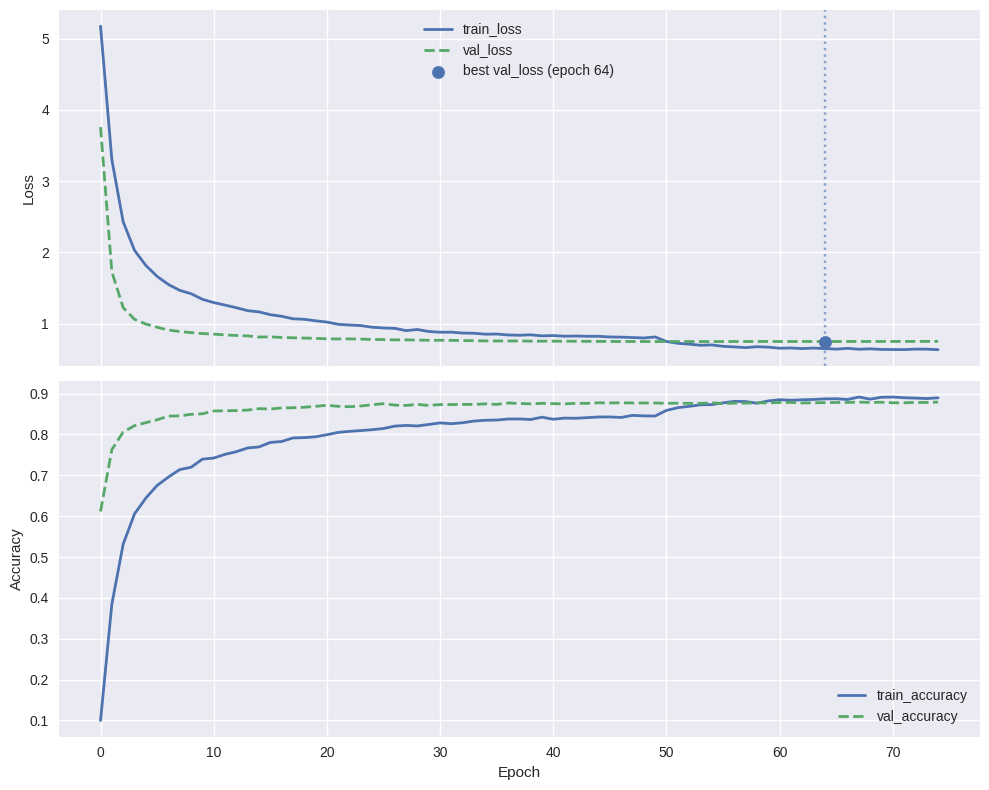

In [ ]:
plot_training_curve(
    csv_path  = Path(CKPT_ROOT) / PROJECT / "phase_1" / "training_log.csv",
    save_path = PLOTS_DIR / "phase1_training_curve.png"
)

# 4.3 - Evaluation

 Loading best model from /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_1/phase_1_best.keras

 Top-1 Accuracy : 0.8806 (88.06%)
 Top-5 Accuracy : 0.9644 (96.44%)

                           precision    recall  f1-score   support

                     ak47       0.75      1.00      0.86         9
            american-flag       1.00      0.78      0.88         9
                 backpack       1.00      0.78      0.88         9
             baseball-bat       0.67      0.67      0.67         9
           baseball-glove       1.00      0.78      0.88         9
          basketball-hoop       0.90      1.00      0.95         9
                      bat       0.82      1.00      0.90         9
                  bathtub       1.00      0.89      0.94         9
                     bear       1.00      1.00      1.00         9
                 beer-mug       1.00      1.00      1.00         9
                billiards       1.00      1.00      1.00         9
     

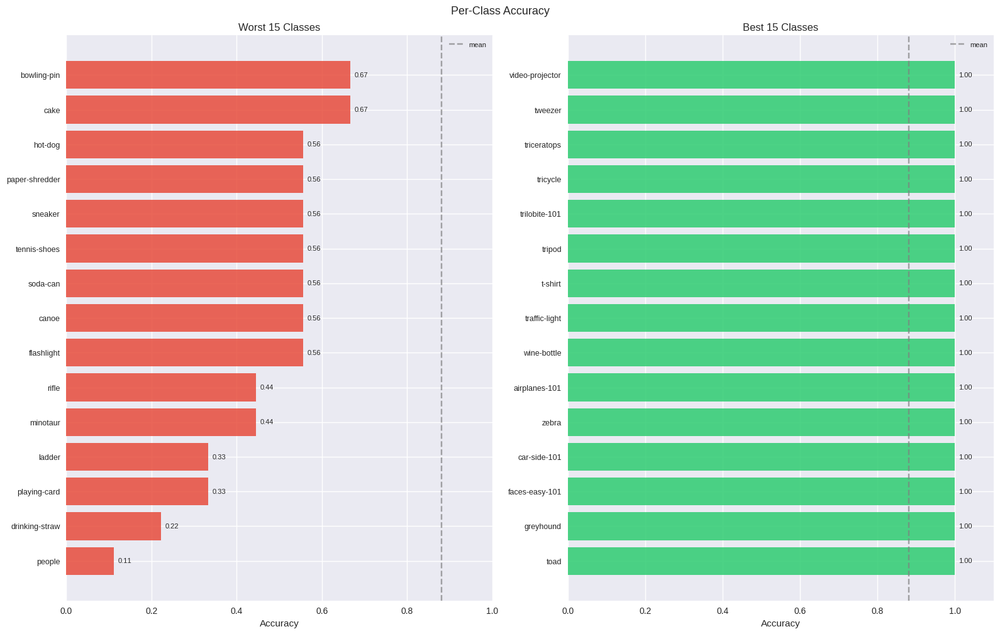

 Plot saved → /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/plots/phase1_worst_predictions.png


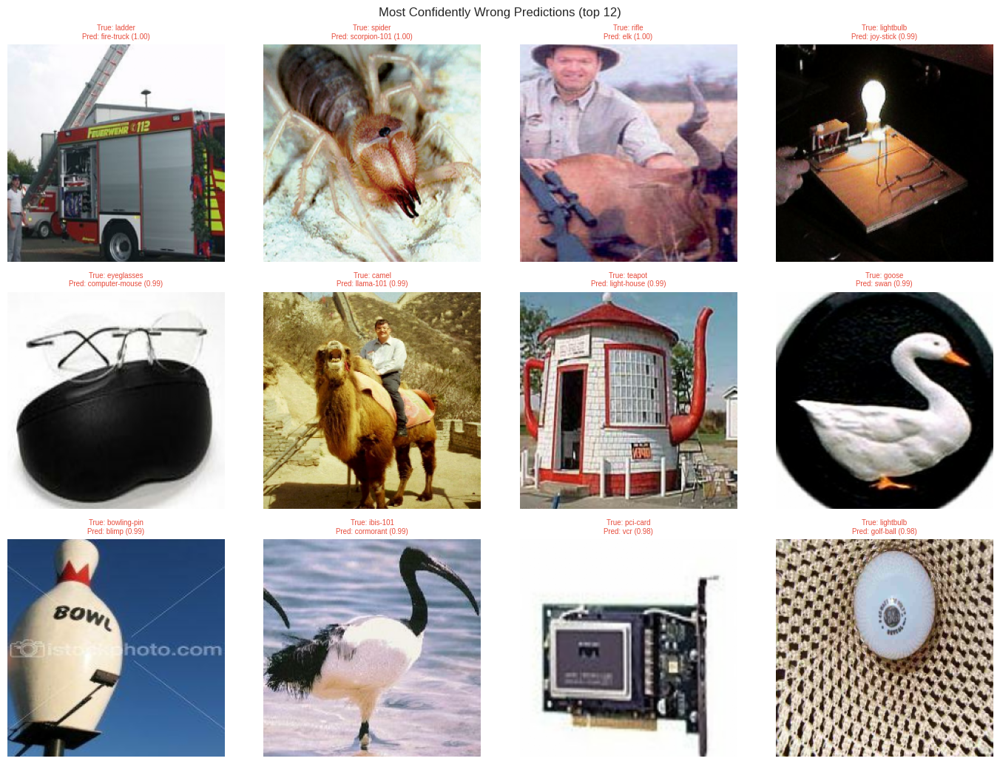

In [ ]:
evaluate_model(
    model       = phase1_trainer.load_best_model(),
    dataset     = test_ds,
    class_names = class_names,
    save_dir    = PLOTS_DIR,
    save_prefix = "phase1"
)

In [ ]:
tf.keras.backend.clear_session()
gc.collect()

0

# 5.1 - Phase 2 : Partial Fine-Tuning (Top Layers Unfrozen)

In [17]:
PHASE2_BLOCKS = [
    'block6','block5','top_conv', 'top_bn', 'top_activation'
]

In [32]:
phase2_trainer = make_trainer(
    experiment_name = "phase_2",
    model_fn        = lambda: build_model(
                            unfreeze_blocks = PHASE2_BLOCKS,
                            learning_rate   = 1e-5,
                            total_steps     = STEPS_PER_EPOCH * EPOCHS_P2,
                            warmstart_path  = get_best_model_path(CKPT_ROOT, PROJECT, "phase_1"),
                            dropout_rate = 0.5
                        ),
    patience        = 10,

              )

 Checkpoint directory: /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_2


In [ ]:
phase2_history = phase2_trainer.fit(train_ds, val_ds, epochs=EPOCHS_P2)

 No valid checkpoints found — starting from scratch

 No checkpoint found — starting from scratch
 Warm-started from /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_1/phase_1_best.keras

  Training from epoch 0 → 50

Epoch 1/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 0s 817ms/step - accuracy: 0.8543 - loss: 0.7520
Epoch 1: val_loss improved from None to 0.71658, saving model to /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_2/phase_2_best.keras

Epoch 1: finished saving model to /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_2/phase_2_best.keras
165/165 ━━━━━━━━━━━━━━━━━━━━ 266s 973ms/step - accuracy: 0.8545 - loss: 0.7500 - val_accuracy: 0.8837 - val_loss: 0.7166 - patience: 0.0000e+00 - best_metric: 0.7166
Epoch 2/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 0s 841ms/step - accuracy: 0.8695 - loss: 0.6923
Epoch 2: val_loss improved from 0.71658 to 0.70620, saving model to /content/drive/MyDrive/Colab_Experiments/caltech256_effic

In [ ]:
phase2_history_2 = phase2_trainer.fit(train_ds, val_ds, epochs=EPOCHS_P2)

# 5.2 - Training Curve

 Plot saved → /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/plots/phase2_training_curve.png


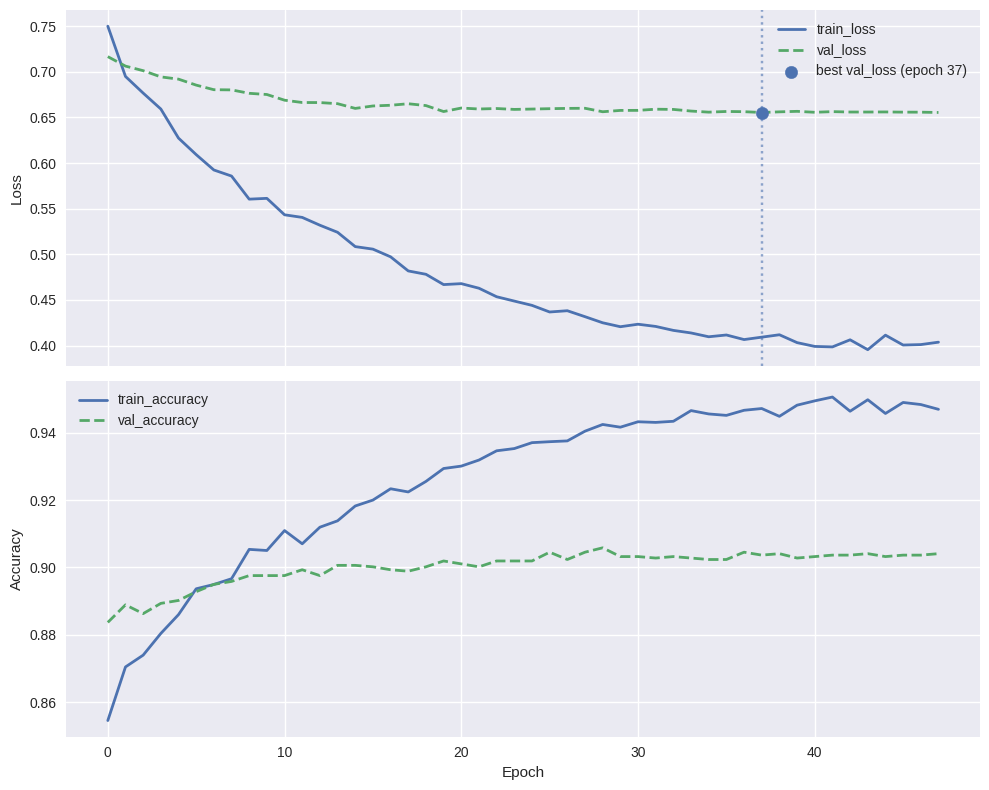

In [ ]:
plot_training_curve(
    csv_path  = Path(CKPT_ROOT) / PROJECT / "phase_2" / "training_log.csv",
    save_path = PLOTS_DIR / "phase2_training_curve.png"
)

# 5.3 - Evaluation

In [36]:
phase2_best = phase2_trainer.load_best_model()

 Loading best model from /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/phase_2/phase_2_best.keras



 Top-1 Accuracy : 0.9071 (90.71%)
 Top-5 Accuracy : 0.9727 (97.27%)

                           precision    recall  f1-score   support

                     ak47       0.75      1.00      0.86         9
            american-flag       0.88      0.78      0.82         9
                 backpack       1.00      0.89      0.94         9
             baseball-bat       0.78      0.78      0.78         9
           baseball-glove       1.00      0.78      0.88         9
          basketball-hoop       0.90      1.00      0.95         9
                      bat       1.00      1.00      1.00         9
                  bathtub       1.00      0.89      0.94         9
                     bear       1.00      1.00      1.00         9
                 beer-mug       1.00      0.89      0.94         9
                billiards       1.00      1.00      1.00         9
               binoculars       1.00      1.00      1.00         9
                 birdbath       0.89      0.89      0.89  

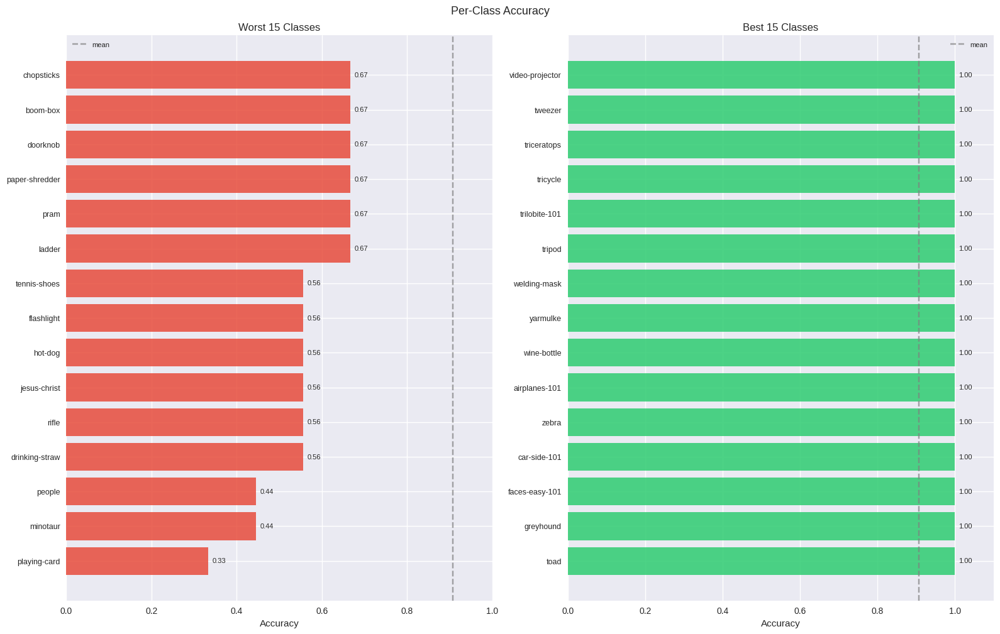

 Plot saved → /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/plots/phase2_worst_predictions.png


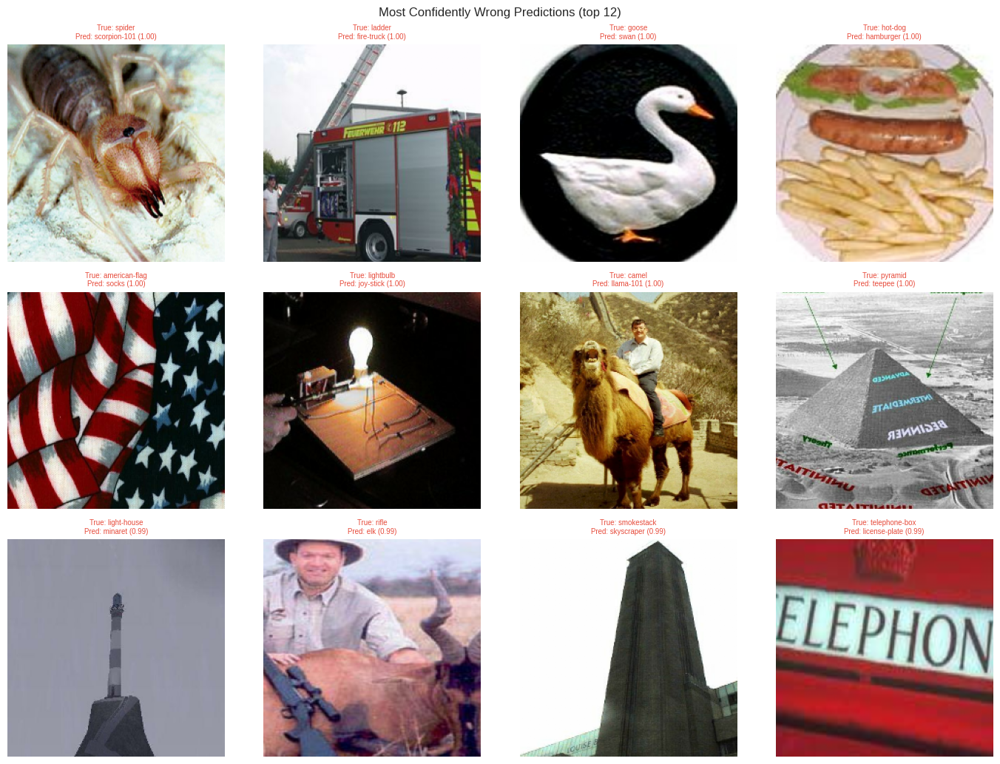

In [37]:
evaluate_model(
    model       = phase2_best,
    dataset     = test_ds,
    class_names = class_names,
    save_dir    = PLOTS_DIR,
    save_prefix = "phase2"
)

In [18]:
tf.keras.backend.clear_session()
gc.collect()

0

# 7.1 - Grad-CAM Grid

 Plot saved → /content/drive/MyDrive/Colab_Experiments/caltech256_efficientnetv2s/plots/grad_cam_grid.png


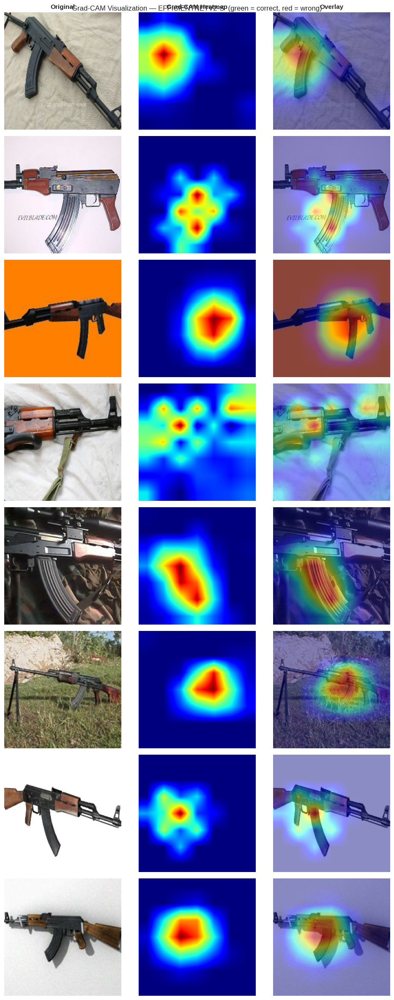

In [38]:
# Visualize what the best model attends to — using Phase 3 (best performing)
plot_grad_cam_grid(
    model       = phase2_best,
    dataset     = test_ds,
    class_names = class_names,
    n           = 8,
    backbone    = "efficientnetv2-s",
    save_path   = PLOTS_DIR / "grad_cam_grid.png"
)

# 7.2 - Inference on Custom Images

In [34]:
def predict_image(image_path: str, model, class_names: list, top_k: int = 5):
    """
    Run inference on a single custom image and display top-k predictions.

    Parameters
    ----------
    image_path  : str            — path to any image file
    model       : tf.keras.Model — trained model
    class_names : list of str    — class names indexed by label
    top_k       : int            — number of top predictions to show. Default: 5
    """
    # Load and preprocess
    raw = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(raw, channels=3)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
    img = tf.cast(img, tf.float32)

    # Predict
    preds     = model.predict(tf.expand_dims(img, 0), verbose=0)[0]
    top_k_idx = np.argsort(preds)[::-1][:top_k]

    # Display image
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

    ax1.imshow(np.clip(img.numpy() / 255.0, 0, 1))
    ax1.axis("off")
    ax1.set_title("Input Image", fontsize=11)

    # Bar chart of top-k predictions
    top_k_labels = [class_names[i] for i in top_k_idx]
    top_k_probs  = [preds[i] for i in top_k_idx]
    colors       = ["#2ecc71" if i == 0 else "#3498db" for i in range(top_k)]

    bars = ax2.barh(range(top_k)[::-1], top_k_probs, color=colors, alpha=0.85)
    ax2.set_yticks(range(top_k)[::-1])
    ax2.set_yticklabels(top_k_labels, fontsize=10)
    ax2.set_xlabel("Confidence")
    ax2.set_title(f"Top {top_k} Predictions", fontsize=11)
    ax2.set_xlim(0, 1.0)
    ax2.grid(axis="x", alpha=0.4)

    for bar, prob in zip(bars, top_k_probs[::-1]):
        ax2.text(
            bar.get_width() + 0.01,
            bar.get_y() + bar.get_height() / 2,
            f"{prob:.3f}",
            va="center", fontsize=9
        )

    plt.suptitle(
        f"Predicted: {class_names[top_k_idx[0]]} ({preds[top_k_idx[0]]*100:.1f}%)",
        fontsize=12, fontweight="bold"
    )
    plt.tight_layout()
    plt.show()

In [35]:
from google.colab import files

Saving test_image_1.jpg to test_image_1.jpg


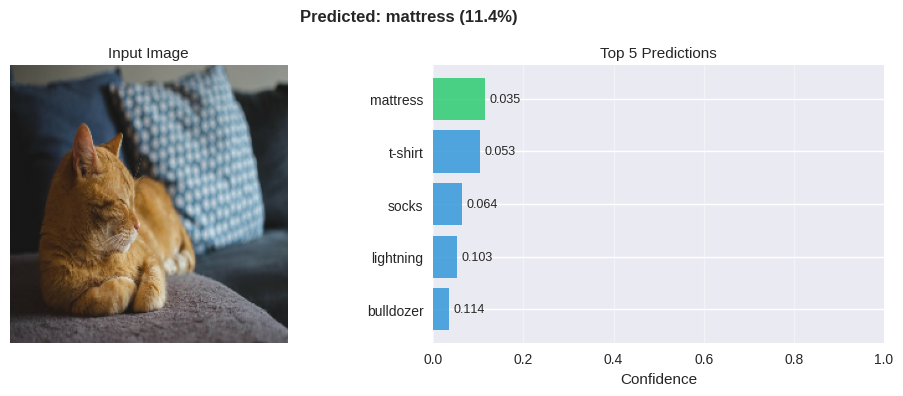

Saving test_image_2.jpg to test_image_2.jpg


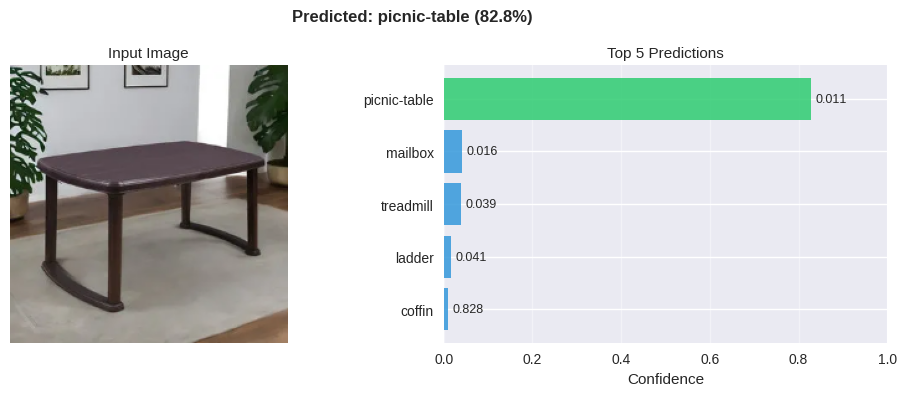

Saving test_image_4.jpg to test_image_4.jpg


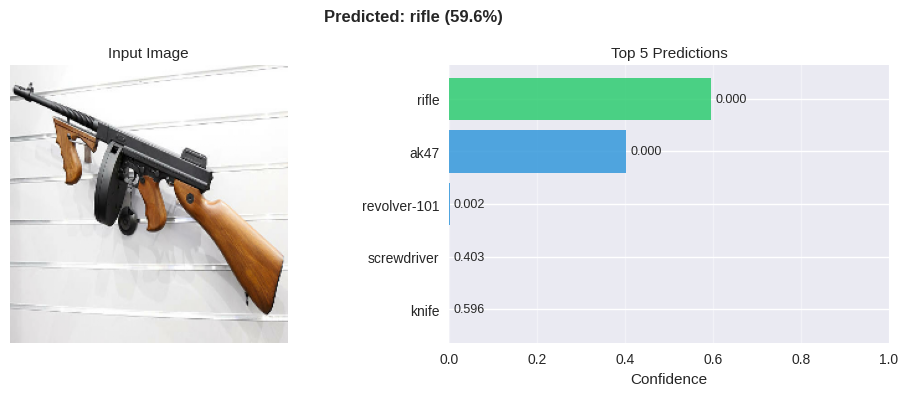

Saving test_image_6.jpg to test_image_6.jpg


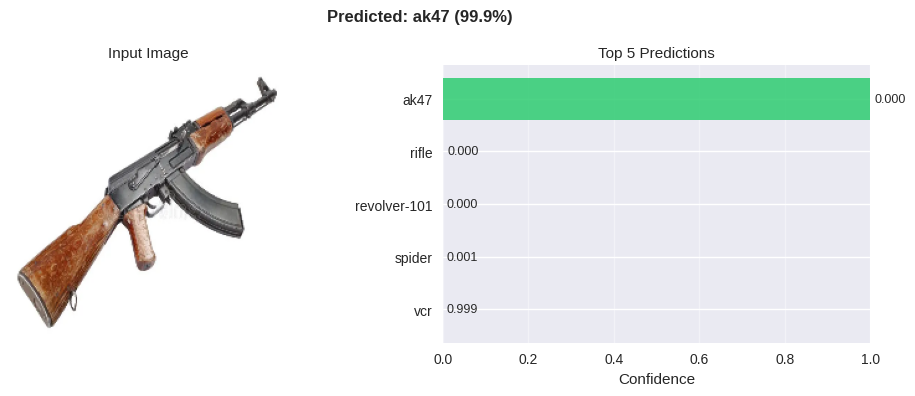

Saving test_image_7.jpg to test_image_7.jpg


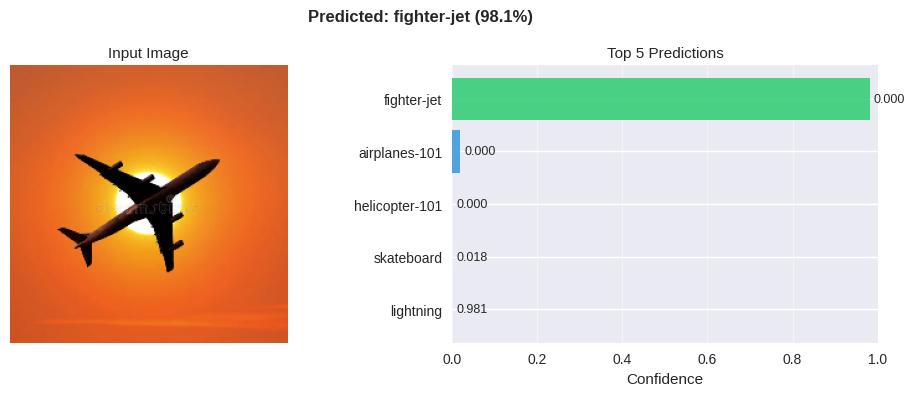

In [39]:
for i in range(5):
  uploaded = files.upload()
  image_path = list(uploaded.keys())[0]

  predict_image(
    image_path  = image_path,
    model       = phase2_best,
    class_names = class_names,
    top_k       = 5
  )